<div class="alert alert-info">
   Nice job guys. What about the negative values coming up in your PPC? Those are unphysical (-1). To do a comparison that answers whether the PLA treatments are significantly different than the control, its best to look at the overlap of the credible regions of your posteriors. Laying out the ECDFs next to each other as you have makes its hard to make any quantitative statement about the comparison (-3). 56/60
    </div>

# Credits
John, Jared, and Maria thought out the priors and the structure of the model. 

Jared performed exploratory data analysis which was polished by John. 

John wrote code for the prior predictive check and for sampling, and Jared correctly applied decentering to the final model and made plots to troubleshoot divergences. 

John wrote the posterior predictive check and the final parameter estimation. 

## Problem 8.1: A hierarchical model for cell viability on biomaterials, 60 points

**Note:** *This problem deals with unpublished research. The authors kindly donated the data set and shared their research and ask that you not disseminate this problem nor its data set beyond the context of this course.*

The [Kornfield lab](http://kornfield.caltech.edu) at Caltech does interesting work at the interfaces of polymer chemistry, polymer physics, and therapeutics with biomaterials. As they develop interesting materials that will interface with the human body, they test to see how different cell types will respond to the material. They are currently developing a material called PLA and did the following assay. They exposed [human umbilical vein endothelial cells](https://en.wikipedia.org/wiki/Human_umbilical_vein_endothelial_cell) (HUVEC) to their PLA material for 24 hours. They then tested the viability of the cells by performing a metabolic assay. The subject the cells to WST-1, a tetrazolium salt. In viable cells, mitochondrial dehydrogenases cleave WST-1, which gives a product that absorbs light in the 450 nm range. This allows for optical quantification of cell viability.

Zach Shao and his coworkers in the Kornfield lab performed this assay on three different varieties of their PLA material. They also performed a control experiment where the cells were grown up absent of any of the PLA material. They also did a negative control experiment in which the cells were treated with a detergent that distrupts the cell membrane. The results from the assay are given in arbitrary units, but those units are consistent throughout the experiments. You can download the data set [here](http://bebi103.caltech.edu/2018_protected/data/shao_et_al_wst-1_assay.csv).

**a)** Perform some exploratory data analysis to investigate the data set.

We will begin by importing the tools of the trade.

In [1]:
# Our numerical workhorses
import numpy as np
import pandas as pd
import bebi103
import pystan

# Import Altair for high level plotting
import altair as alt
import altair_catplot as altcat
# Pevent bulky altair plots
alt.data_transformers.enable('json')

# Import Bokeh modules for interactive plotting
import bokeh.io
import bokeh.plotting
from bokeh.palettes import all_palettes
# Set up Bokeh for inline viewing
bokeh.io.output_notebook()

/anaconda/lib/python3.6/site-packages/bebi103/viz.py:30: UserWarning: DataShader import failed with error "No module named 'datashader.bokeh_ext'".
Features requiring DataShader will not work and you will get exceptions.
  Features requiring DataShader will not work and you will get exceptions.""")


Loading BokehJS ...

We now import and tidy up the data:

In [2]:
df = pd.read_csv('../data/shao_et_al_wst-1_assay.csv', comment='#')
# Change "One" to 1 in Experiment column. 
col_names = {"One":1, "Two":2, "Three":3}
arr = df["Experiment"].values
exp = np.zeros(len(arr), dtype=int)
for i in range(0, len(arr)):
    exp[i] = col_names[arr[i]]
df["Experiment"] = exp
# Peek at data
df.head()

,Treatment,Experiment,assay_result
0,Control,1,1.45945
1,Control,1,1.51035
2,Control,1,1.80045
3,Control,1,1.83745
4,PLA_1,1,1.42015


and then produce a simple plot using altair.

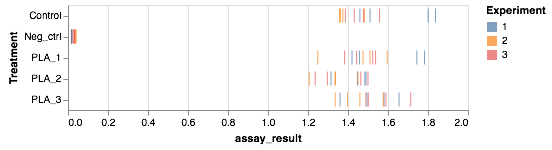

In [3]:
alt.Chart(df).mark_tick().encode(
        x='assay_result:Q',
        y='Treatment:N',
        color = alt.Color('Experiment:N'),
    )

From this plot, we can clearly see that the negative control cells have nearly zero absorbance, but each PLA is not clearly better or worse than the other. Due to exceptionally low negative controls, I will omit them from the following ECDFs. 

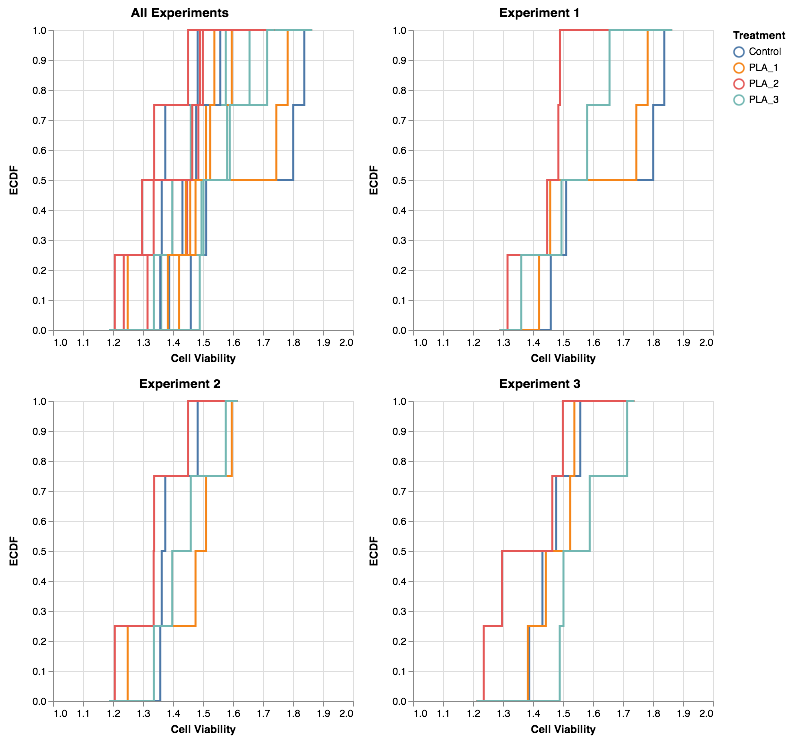

In [4]:
def make_ecdf(bool_index, title):
    c = altcat.catplot(data=df_no_control.loc[bool_index,:],
               mark='line',
               encoding=dict(x=alt.X('assay_result:Q',
                                     scale=alt.Scale(
                                           domain=(1, 2),
                                           clamp=True),
                                    title = "Cell Viability"),
                             color = alt.Color('Treatment:N', title='Treatment')),
               transform='ecdf'
              ).properties(height=300,
                           width=300,
                           title = title)
    return c
df_no_control = df[df["Treatment"] != "Neg_ctrl"]
# Segregate data by experiment
E1 = df_no_control['Experiment'] == 1
E2 = df_no_control['Experiment'] == 2
E3 = df_no_control['Experiment'] == 3

(((make_ecdf(E1, "All Experiments") 
 + make_ecdf(E2, "All Experiments") 
 + make_ecdf(E3, "All Experiments")) 
 | make_ecdf(E1, "Experiment 1")) 
 &(make_ecdf(E2, "Experiment 2") 
 | make_ecdf(E3, "Experiment 3")))

PLA 2 seems to be the worst in terms of cell viability, but the best material seems to vary between experiments. We will now transition to hierarchical modeling. 

**b)** Construct a hierarchical model describing the results. Because you are not familiar with this kind of experiment, it will be hard to construct priors. In doing so, assume that a typical assay value for a reasonably viable group of cells is about unity, and the typical baseline (absence of viable cells) does not go much beyond 0.05. Note that constructing the hierarchical model involes performing prior predictive checks. Note also that you may need to consider some pragmatic tradeoffs when doing your prior predictive checks (such as occasional unphysical results). 

Changing name of key: `my_dict[new_key] = my_dict.pop[old_key]`

Merging:  `dictionary_3 = {**dict_1, **dict_2}`

Since the negative control was so successful, we will omit it from the analysis. Fluorescence units are arbitrary, and thus even a small correction will not be informative.

We decided to model the data obtained from each plastic (or lackthereof) using 3 hyperparameters: 

1. $\theta_H$: The average fluoresence for a given type of plastic.
2. $\sigma_H$: The standard deviation of fluoresence values obtained on a given day for a particular plastic.
3. $\sigma_P$: The standard deviation of the average fluorescence value on a given day from the total average fluorescence for the given type of plastic. 

We have three experients, and I will denote that a number is for a particular experiment by using the subscript $i$, where $1 \leq i \leq 3$. Our model is as follows:
\begin{align}
\theta_H \sim & \, \text{LogNorm}(0.25, 0.50)\\
\sigma_H \sim & \, \text{Half-Norm}(0, 0.5)\\
\sigma_P \sim & \, \text{Half-Norm}(0, 0.5)\\
\theta_i \sim & \, \text{Norm}(\theta_H, \sigma_P)\\
\text{fluorescence}_i \sim & \, \text{Norm}(\theta_i, \sigma_H)
\end{align}
This paricular choice of model might seem unintuitive. Originally we wanted to model the standard deviation of each experiment individually, rather than just model with the two deviations shown. However, we recalled Justin Bois stating in lecture that this approach was not optimal. Thus, we chose to model our standard deviations differently. Note that the theta hyperparameter was chosen to be log-normal specifically so that we get positive fluorescence. 

## Prior Predictive Check
We will now write a generative model in Stan in order to do a prior-predictive check. As an aside, we decided to keep our stan models within the notebook because this permitted modeling on Jared's machine for unknown reasons. 

In [5]:
model_code = '''
data {
    int N;
    int num_exps;
    int experiment[N];
}

generated quantities {
    real<lower=0> theta_H;
    real<lower=0> sigma_H;
    real<lower=0> sigma_P;
    vector[num_exps] theta;
    vector[N] fluorescence;
    
    // Draw parameters
    theta_H = lognormal_rng(0.25, 0.5); 
    // Here, fabs is used to draw from the half-normal distribution.
    sigma_H = fabs(normal_rng(0, .5));
    sigma_P = fabs(normal_rng(0, .5));
    
    for (i in 1:num_exps)
    { 
        theta[i] = normal_rng(theta_H, sigma_P);
    }
    for (i in 1:N) 
    {
        fluorescence[i] = normal_rng(theta[experiment[i]], sigma_H);
    }
}
'''
sm = bebi103.stan.StanModel(model_code=model_code)

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_3866cdd9710268cce71014c65654a30d NOW.


In file included from /var/folders/w5/3dvb5cqj0lx59zjrblf9vszc0000gn/T/tmp9u5y4onx/stanfit4anon_model_3866cdd9710268cce71014c65654a30d_2152652772397123103.cpp:642:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/arrayobject.h:4:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/ndarrayobject.h:18:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/ndarraytypes.h:1823:
/anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/npy_1_7_deprecated_api.h:15:2: warning: "Using deprecated NumPy API, disable it by "          "#defining NPY_NO_DEPRECATED_API NPY_1_7_API_VERSION" [-W#warnings]
#warning "Using deprecated NumPy API, disable it by " \
 ^
/var/folders/w5/3dvb5cqj0lx59zjrblf9vszc0000gn/T/tmp9u5y4onx/stanfit4anon_model_3866cdd9710268cce71014c65654a30d_2152652772397123103.cpp:9397:30: warning: comparison of integers of different signs: 'Py_ssize_t' (aka 'long') and 'std::__1::

Now we use this model to generate data.

In [6]:
# I will only generate data for one type of PLA. Since we are not specifiying
# any differences based on the PLA, this is fine for a prior predictive check. 
df_generative = df[df["Treatment"]=="PLA_1"]
# Synthesize the data dictionary required for input
num_exps = len(np.unique(df_generative["Experiment"].values)) # this is just 3
experiment = df_generative["Experiment"].values
N = len(experiment)
data = dict(N=N,
            num_exps=num_exps,
            experiment=experiment)
# Generate samples
samples_gen = sm.sampling(data=data,
                          algorithm='Fixed_param',
                          warmup=0,
                          chains=1,
                          iter=100)
# Store samples in a dataframe
df_gen = bebi103.stan.to_dataframe(samples_gen, diagnostics=False)
df_gen.head()

,chain,chain_idx,warmup,theta_H,sigma_H,sigma_P,theta[1],theta[2],theta[3],fluorescence[1],...,fluorescence[4],fluorescence[5],fluorescence[6],fluorescence[7],fluorescence[8],fluorescence[9],fluorescence[10],fluorescence[11],fluorescence[12],lp__
0,1,1,0,0.849301,0.001853,0.410771,1.170827,1.550538,0.662269,1.170330,...,1.171745,1.548408,1.550787,1.552286,1.553753,0.665039,0.659074,0.661018,0.662584,0.0
1,1,2,0,1.281521,0.063741,0.175307,1.545046,1.338475,1.031629,1.630506,...,1.584627,1.281430,1.334646,1.450706,1.367361,1.087280,1.045949,1.118850,0.971400,0.0
2,1,3,0,1.200327,0.866957,0.122388,1.171009,1.068512,1.202020,1.918608,...,-0.993871,1.631452,2.040097,0.786832,0.129512,2.504077,0.221377,1.732409,3.921037,0.0
3,1,4,0,1.802017,0.156049,0.345961,1.372454,1.187028,1.364812,1.573109,...,1.391421,1.238393,1.220925,1.402383,1.141280,1.493470,1.351827,1.226049,0.935683,0.0
4,1,5,0,2.771862,0.064619,0.005393,2.776522,2.779444,2.777446,2.879937,...,2.836463,2.901029,2.857020,2.689215,2.791651,2.832045,2.765622,2.790034,2.764573,0.0


Sampling worked. I'd like to plot, but to do this I need to know which fluorescence values correspond to which experiment. Let's peek at the experiment array, and then sort the plots accordingly. 

In [7]:
experiment

array([1, 1, 1, 1, 2, 2, 2, 2, 3, 3, 3, 3])

In [8]:
df_exp1 = df_gen[["fluorescence[%i]"%i for i in range(1, 5)]]
df_exp2 = df_gen[["fluorescence[%i]"%i for i in range(5, 9)]]
df_exp3 = df_gen[["fluorescence[%i]"%i for i in range(9, 13)]]
df_exp3.head()

,fluorescence[9],fluorescence[10],fluorescence[11],fluorescence[12]
0,0.665039,0.659074,0.661018,0.662584
1,1.087280,1.045949,1.118850,0.971400
2,2.504077,0.221377,1.732409,3.921037
3,1.493470,1.351827,1.226049,0.935683
4,2.832045,2.765622,2.790034,2.764573


Now that we have sorted generated data by experiment, we can make reasonable plots. At this point, each plot should appear nearly identical, but I will plot all three for the sake of a sanity check. 

In [9]:
dfs = [df_exp1, df_exp2, df_exp3]
for i in range(1, 4):
    name = "Experiment %i" % i
    dataframe = dfs[i-1]
    p = bebi103.viz.ecdf(dataframe.iloc[0].values, 
                         formal=True, 
                         line_width=0.5, 
                         x_axis_label='Fluorescence',
                         title = name)
    for j in range(1, len(df_gen)):
        p = bebi103.viz.ecdf(dataframe.iloc[j].values, 
                         formal=True, 
                         line_width=0.5, 
                         x_axis_label='Fluorescence',
                         p=p)
    p.x_range = bokeh.models.Range1d(-2, 5)
    bokeh.io.show(p)

The prior predictive check seems very reasonable! This means that I can code up the actual model in stan and draw samples using Marcov Chain Monte Carlo!
# MCMC Sampling

In [10]:
model_code = '''
data 
{
    int N;
    int num_exps;
    int experiment[N];
    real fluorescence[N];
}

parameters 
{
    real<lower=0> theta_H;
    real<lower=0> sigma_H;
    real<lower=0> sigma_P;
    vector[num_exps] theta;
}

model
{
    // hyperparameters
    theta_H ~ lognormal(0.25, 0.5); 
    sigma_H ~ normal(0, 0.5);
    sigma_P ~ normal(0, 0.5);

    // direct parameters
    for (i in 1:num_exps)
    { 
        theta[i] ~ normal(theta_H, sigma_P);
    }

    // data!
    fluorescence ~ normal(theta[experiment], sigma_H);
}

// posterior predictive check
generated quantities 
{
    real fluorescence_ppc[N];
    for (i in 1:N) 
    {
        fluorescence_ppc[i] = normal_rng(theta[experiment[i]], sigma_H);
    }
}
'''

sm_hier = bebi103.stan.StanModel(model_code=model_code)

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_43628ee5394c972109bdd0437a5f283f NOW.


In file included from /var/folders/w5/3dvb5cqj0lx59zjrblf9vszc0000gn/T/tmpv200sw4n/stanfit4anon_model_43628ee5394c972109bdd0437a5f283f_8956936346145181246.cpp:642:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/arrayobject.h:4:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/ndarrayobject.h:18:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/ndarraytypes.h:1823:
/anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/npy_1_7_deprecated_api.h:15:2: warning: "Using deprecated NumPy API, disable it by "          "#defining NPY_NO_DEPRECATED_API NPY_1_7_API_VERSION" [-W#warnings]
#warning "Using deprecated NumPy API, disable it by " \
 ^
/var/folders/w5/3dvb5cqj0lx59zjrblf9vszc0000gn/T/tmpv200sw4n/stanfit4anon_model_43628ee5394c972109bdd0437a5f283f_8956936346145181246.cpp:9397:30: warning: comparison of integers of different signs: 'Py_ssize_t' (aka 'long') and 'std::__1::

The model compiled! Let's now sample from the posterior. 

In [11]:
def sample_pla(model, treatment):
    # I will start by sampling the distribution for the first PLA
    df_1 = df[df["Treatment"]==treatment]
    # Synthesize the data dictionary required for input
    num_exps = len(np.unique(df_1["Experiment"].values)) # this is just 3
    experiment = df_1["Experiment"].values
    N = len(experiment)
    assay_res_1 = df_1["assay_result"].values
    data = dict(N=N,
                num_exps=num_exps,
                experiment=experiment,
                fluorescence = assay_res_1)
    samples_hier = model.sampling(data=data, 
                                  control=dict(adapt_delta = .9999999,
                                               max_treedepth = 12),
                                  warmup=2000, 
                                  iter=10000, 
                                  thin=5)
    bebi103.stan.check_all_diagnostics(samples_hier)
    return samples_hier
samples_hier = sample_pla(sm_hier, "PLA_1")

n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
37 of 6400 (0.578125%) iterations ended with a divergence.
  Try running with larger adapt_delta to remove divergences.
0 of 6400 (0.0%) iterations saturated the maximum tree depth of 12.
E-BFMI indicated no pathological behavior.


We appear to be getting some divergences. Let's check a parallel coordinate plot and a corner plot to see if these divergences share a common problem. 

In [12]:
parameters = (['theta_H', 'sigma_H', 'sigma_P']
            + ['theta[1]', 'theta[2]', 'theta[3]'] 
            + ['lp__'])
def plot_parallel_coordinate(samples, parameters):
    samples_dataframe = bebi103.stan.to_dataframe(samples)
    # Which parametets to use in parallel coordinate plot
    pars = (parameters)

    # Transformations to get them all on the same scale
    transformation = (  [lambda x: x / 10, None, None] 
                      + [lambda x: x / 10]*(len(pars)-4)
                      + [lambda x: x / np.abs(x).max()])

    bokeh.io.show(bebi103.viz.parcoord_plot(samples,
                                            pars=pars,
                                            transformation=transformation,
                                            xtick_label_orientation='vertical'))
    
plot_parallel_coordinate(samples_hier, parameters)

In [13]:
bokeh.io.show(bebi103.viz.corner(samples_hier,
                                        pars=['theta_H', 'sigma_H', 'sigma_P']))

/anaconda/lib/python3.6/site-packages/bebi103/viz.py:2555: UserWarning: Rendering so many points without DataShader is ill-advised.
  'Rendering so many points without DataShader is ill-advised.')


Most divergences have a small $\sigma_P$. Let's try a non-centered model

In [14]:
model_code = '''
data 
{
    int N;
    int num_exps;
    int experiment[N];
    real fluorescence[N];
}

parameters 
{
    real<lower=0> theta_H;
    real<lower=0> sigma_H;
    real<lower=0> sigma_P;
    vector[num_exps] theta_tilde;
}

transformed parameters
{
    vector[num_exps] theta;
    
    theta = theta_H + theta_tilde * sigma_P;
}

model
{
    // hyperparameters
    theta_H ~ lognormal(0.25, 0.5); 
    sigma_H ~ normal(0, 0.5);
    sigma_P ~ normal(0, 0.5);
 

    // direct parameters
    theta_tilde ~ normal(0,1);
    
    // data!
    fluorescence ~ normal(theta[experiment], sigma_H);
}

// posterior predictive check
generated quantities 
{
    real fluorescence_ppc[N];
    for (i in 1:N) 
    {
        fluorescence_ppc[i] = normal_rng(theta[experiment[i]], sigma_H);
    }
}
'''

sm_mcmc_noncentered = bebi103.stan.StanModel(model_code=model_code)

INFO:pystan:COMPILING THE C++ CODE FOR MODEL anon_model_b014528944617158c1858bef4c7dddd8 NOW.


In file included from /var/folders/w5/3dvb5cqj0lx59zjrblf9vszc0000gn/T/tmpk_a9lhtr/stanfit4anon_model_b014528944617158c1858bef4c7dddd8_124562349882121526.cpp:642:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/arrayobject.h:4:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/ndarrayobject.h:18:
In file included from /anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/ndarraytypes.h:1823:
/anaconda/lib/python3.6/site-packages/numpy/core/include/numpy/npy_1_7_deprecated_api.h:15:2: warning: "Using deprecated NumPy API, disable it by "          "#defining NPY_NO_DEPRECATED_API NPY_1_7_API_VERSION" [-W#warnings]
#warning "Using deprecated NumPy API, disable it by " \
 ^
/var/folders/w5/3dvb5cqj0lx59zjrblf9vszc0000gn/T/tmpk_a9lhtr/stanfit4anon_model_b014528944617158c1858bef4c7dddd8_124562349882121526.cpp:9397:30: warning: comparison of integers of different signs: 'Py_ssize_t' (aka 'long') and 'std::__1::ve

Now I will sample and see if there are any differences. 

In [15]:
samples_noncentered_1 = sample_pla(sm_mcmc_noncentered, "PLA_1")

n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
0 of 6400 (0.0%) iterations ended with a divergence.
0 of 6400 (0.0%) iterations saturated the maximum tree depth of 12.
E-BFMI indicated no pathological behavior.


In [16]:
parameters = (['theta_H', 'sigma_H', 'sigma_P']
            + ['theta[1]', 'theta[2]', 'theta[3]'] 
            + ['theta_tilde[1]', 'theta_tilde[2]','theta_tilde[3]', 'lp__'])
plot_parallel_coordinate(samples_noncentered_1, parameters)

In [17]:
bokeh.io.show(bebi103.viz.corner(samples_noncentered_1,
                                        pars=['theta_H', 'sigma_H', 'sigma_P']))

/anaconda/lib/python3.6/site-packages/bebi103/viz.py:2555: UserWarning: Rendering so many points without DataShader is ill-advised.
  'Rendering so many points without DataShader is ill-advised.')


Yay! Noncentering resulted in successful sampling with few divergences! Let's repeat the sampling for each PLA and the control, and double check that these other distributions sample well as well. 

In [18]:
samples_noncentered_2 = sample_pla(sm_mcmc_noncentered, "PLA_2")
samples_noncentered_3 = sample_pla(sm_mcmc_noncentered, "PLA_3")
samples_noncentered_control = sample_pla(sm_mcmc_noncentered, "Control")

n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
0 of 6400 (0.0%) iterations ended with a divergence.
0 of 6400 (0.0%) iterations saturated the maximum tree depth of 12.
E-BFMI indicated no pathological behavior.
n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
0 of 6400 (0.0%) iterations ended with a divergence.
0 of 6400 (0.0%) iterations saturated the maximum tree depth of 12.
E-BFMI indicated no pathological behavior.
n_eff / iter looks reasonable for all parameters.
Rhat looks reasonable for all parameters.
0 of 6400 (0.0%) iterations ended with a divergence.
0 of 6400 (0.0%) iterations saturated the maximum tree depth of 12.
E-BFMI indicated no pathological behavior.


In [19]:
plot_parallel_coordinate(samples_noncentered_2, parameters)
plot_parallel_coordinate(samples_noncentered_3, parameters)
plot_parallel_coordinate(samples_noncentered_control, parameters)

## Posterior-predictive-Check
Performing the poterior predictive check requires making an ECDF that is rather involved, so I will write a function for this. 

In [20]:
def plot_ppc(pla, samples):
    """Plots the posterior predictive check on top of the actual data for a given PLA."""
    # Plot Data
    dataframe = df[df["Treatment"]==pla]
    for num in range(1, 4):
        sub_dataframe = dataframe[dataframe["Experiment"]==num]
        if num == 1:
            p = bebi103.viz.ecdf(sub_dataframe["assay_result"].values, 
                                 formal=True, 
                                 line_width=2, 
                                 x_axis_label='Fluorescence', 
                                 color = 'red',
                                 title = pla)
        else:
            p = bebi103.viz.ecdf(sub_dataframe["assay_result"].values, 
                                 formal=True, 
                                 line_width=2, 
                                 x_axis_label='Fluorescence',
                                 color = 'red',
                                 p=p)

    # Plot posterior predictive check
    samples_df = bebi103.stan.extract_array(samples, 'fluorescence_ppc')
    for chain_index in range(1, 25):
        for chain in range(1, 5):
            df_plot = samples_df[samples_df["chain"]==chain]
            df_plot = df_plot[df_plot["chain_idx"]==chain_index]
            fluorescence = df_plot["fluorescence_ppc"].values

            # Plot an ecdf for each experiment, of which there are three in a single sample.
            for i in range(0, 3):
                to_plot = fluorescence[(i * 4) : (i * 4 + 4)] 
                p = bebi103.viz.ecdf(to_plot, formal=True, line_width = 0.13, p=p)
    bokeh.io.show(p)

Now I will call this function for each type of PLA so that we can see how the data have updated our priors. 

In [21]:
plas = ["PLA_1", "PLA_2", "PLA_3", "Control"]
samples = [samples_noncentered_1, 
           samples_noncentered_2, 
           samples_noncentered_3, 
           samples_noncentered_control]

for pla, sample in zip(plas, samples):
    plot_ppc(pla, sample)

The posteriors are certainly different from the priors, and seem to be informed well by the data. We can now move on to parameter estimation. 

**c)** The authors are interested in the ratio of the PLA assay results to control. Using your hierarchical model, perform parameter estimation to compare the ratios PLA-1/control, PLA-2/control, and PLA-3/control. *Hint*: When you do not have much data, such as is the case here, using a noncentered parametrization is often very important.

The way we constructed this model, all parameters for different types of PLAs were completely independent. Thus, sampling one time with the full model is completely equivalent to sampling 3 times with individual models because the steps for each set of parameters (per PLA type) are completely indpenedent of the steps for all other sets of parameters. Thus, performing element-wise division of the samples for each pla and the samples for the control will give us the distribution of their ratios. 

Following our modeling, the best approximation of the fluorescence for a sample (representing an entire set of three experiments) is the hyperparameter $\theta_H$. Thus, we will only consider the arrays of these values when performing parameter estimation. 

In [22]:
samples_nc_df_1 = bebi103.stan.to_dataframe(samples_noncentered_1)
samples_nc_df_2 = bebi103.stan.to_dataframe(samples_noncentered_2)
samples_nc_df_3 = bebi103.stan.to_dataframe(samples_noncentered_3)
samples_nc_df_control = bebi103.stan.to_dataframe(samples_noncentered_control)
theta_1_over_control = samples_nc_df_1["theta_H"].values / samples_nc_df_control["theta_H"].values
theta_2_over_control = samples_nc_df_2["theta_H"].values / samples_nc_df_control["theta_H"].values
theta_3_over_control = samples_nc_df_3["theta_H"].values / samples_nc_df_control["theta_H"].values
ratios = [theta_1_over_control, theta_2_over_control, theta_3_over_control]

Time to report means, plot ECDFs, and call it a day. 

In [23]:
for i, arr in zip(range(1, 4), ratios):
    print("Mean of PLA %i over control: %.3f"%(i, np.average(arr)))

Mean of PLA 1 over control: 1.023
Mean of PLA 2 over control: 0.939
Mean of PLA 3 over control: 1.030


In [24]:
p = bokeh.plotting.figure(title = "Ratios of cell viability on PLA materials versus control")
colors = all_palettes['Viridis'][3]
for i in range(0, 3):
    p = bebi103.viz.ecdf(ratios[i], 
                         formal=True, 
                         line_width=2, 
                         x_axis_label='Ratio', 
                         color = colors[i],
                         legend = "PLA %i"%(i+1),
                         p=p)
p.x_range = bokeh.models.Range1d(0.5, 2)
p.legend.location = "top_left"
bokeh.io.show(p)

In conclusion, even after hefty data-analysis, PLAs 1 and 3 are indistinguishable, and about as good as the control at sustaining cell viability. In contrast, we can clearly see that PLA 2 harmful to cell metabolism. 